<hr style="border-top: 3px double #8c8b8b;"/>
<br/>
<center><font size=7 color="green">データサイエンスII   第7回</font><br/>
2021.5.25
</center>
<hr style="border-top: 3px double #8c8b8b;"/>


+ 学籍番号：
+ 氏名：
+ rainbow id:

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import scipy as sy

# <font color="green" size=5>実習1.  2 次元データ集合の可視化</font>

## dfD71 の定義

In [2]:
cov = [[0.2, 0], [0, 0.2]]  # diagonal covariance
u =np.array([np.random.multivariate_normal([2*i,2*j], cov, 1000) for i in range(2) for j in range(2)])
u1=np.vstack(u)
dfD71=pd.DataFrame(u1,columns=["x","y"])

## 単純プロット

In [3]:
px.scatter(dfD71,x="x",y="y")

### 濃淡で密度を表示

In [4]:
# opacity で透明度を指定
fig=px.scatter(dfD71,x="x",y="y",opacity=0.2)
# x,y軸の比を同じに
fig.update_yaxes(scaleanchor="x", scaleratio=1)
# 画像の大きさを指定
fig.update_layout(width=500,height=500)
fig.show()


## 密度関数の表示

### 等高線

In [5]:
fig = px.density_contour(dfD71, x="x", y="y",nbinsx=20,nbinsy=20,marginal_x="histogram", marginal_y="histogram")
#fig.add_scatter(x=dfD71.x,y=dfD71.y,mode="markers")
#fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500,height=500)
fig.show()

### 濃淡で表示

In [6]:
fig = px.density_contour(dfD71, x="x", y="y",nbinsx=20,nbinsy=20)
#fig.add_scatter(x=dfD71.x,y=dfD71.y,mode="markers")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500,height=500)
fig.show()

## 二次元ストグラム

+ x方向の分割数は nbinsx
+ y方向の分割数は nbinsy

+ x,y方向ともに分割数50

In [7]:
fig=px.density_heatmap(dfD71,x="x",y="y",nbinsx=50,nbinsy=50)
#fig.add_scatter(x=dfD71.x,y=dfD71.y,mode="markers")
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500,height=500)


+ 分割数をx,y方向は30

In [8]:
fig=px.density_heatmap(dfD71,x="x",y="y",nbinsx=30,nbinsy=30)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500,height=500)
fig.show()
#fig.add_scatter(x=df.x,y=df.y,mode="markers")

# <font color="green" size=5>実習2. 3次元データ集合の可視化</font>

## data 集合 dfD72 の設定

In [9]:
dfD72A=pd.read_csv("https://ac-net.org/tjst/lct/21/21ds2/dfD72A.csv")

In [10]:
dfD72=dfD72A

In [11]:
dfD72.axes

[RangeIndex(start=0, stop=1000, step=1),
 Index(['x', 'y', 'z', 'id'], dtype='object')]

## １次元プロット

In [12]:
dfD72[["x","y","z"]].T

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
x,0.097640,0.006567,0.586842,-0.324564,0.368267,0.334314,-0.386042,-0.474160,-0.327053,0.214461,...,0.053861,0.127510,0.194350,0.513889,-0.742734,0.101304,0.516214,-0.259107,0.089751,0.214284
y,-0.100458,0.488094,0.878984,-0.556820,-0.182056,-0.040854,-0.798580,-0.488256,-0.217434,0.226408,...,-0.032329,-0.186840,0.315197,0.248779,-0.674356,0.123439,0.380809,-0.188309,0.299896,0.445548
z,0.130889,0.024434,0.833516,-0.463224,0.499891,0.457732,-0.555272,-0.666459,-0.455921,0.301613,...,0.146705,0.512162,-0.116046,0.566925,-0.348927,0.000570,0.373851,-0.191883,-0.284252,-0.274446


In [13]:
import plotly.figure_factory as ff
fig = ff.create_distplot(dfD72[["x","y","z"]].values.T,["x","y","z"], \
                         curve_type='kde', show_rug=True, bin_size=.1)
fig.show()

In [14]:
import plotly.figure_factory as ff
fig = ff.create_distplot([dfD72.x,dfD72.y,dfD72.z],["x","y","z"], \
                         curve_type='kde', show_rug=True, bin_size=.1)
fig.show()

## ２変数への射影

### x,y成分のプロット

In [15]:
fig=px.scatter(dfD72,x="x",y="y",color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

### 色々な組み合わせを見る

In [16]:
def pxscatter(u,v):
    fig=px.scatter(dfD72,x=u,y=v,color="id")
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=500,height=500)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
interact(pxscatter      
    ,u=widgets.RadioButtons(description="第1変数",value="x",options=["x","y","z"])
    ,v=widgets.RadioButtons(description="第2変数",value="y",options=["x","y","z"])
        )

interactive(children=(RadioButtons(description='第1変数', options=('x', 'y', 'z'), value='x'), RadioButtons(descr…

<function __main__.pxscatter(u, v)>

### 二変数組すべてについてのプロット

#### px.scatter_matrix

In [17]:
fig=px.scatter_matrix(dfD72,opacity=0.3,color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

#### seaborn.pairplot

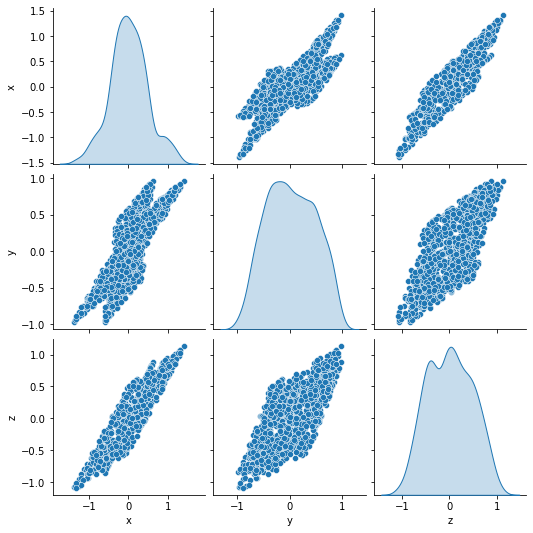

In [18]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],diag_kind="kde")

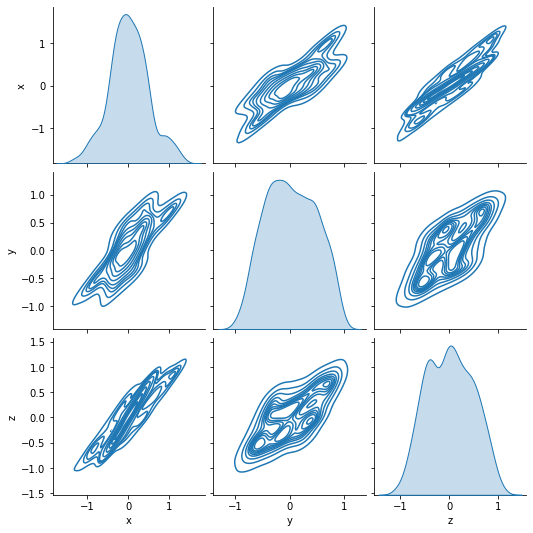

In [19]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="kde")

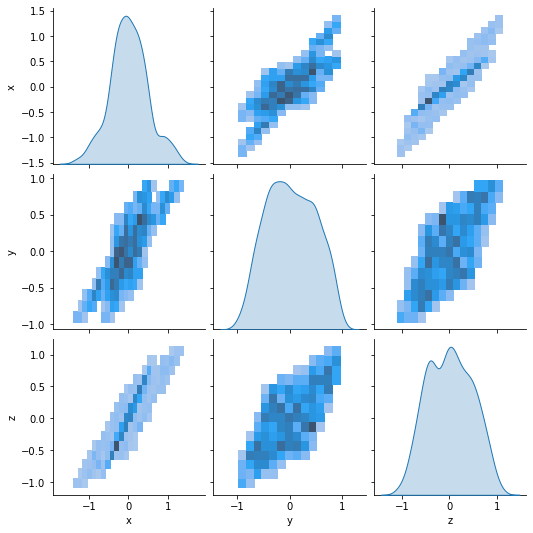

In [20]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="hist",diag_kind="kde")

## 直交射影 $R^3\rightarrow R^2$による射影

+ $\mathbf a\in R^3$に対し、$(\mathbf a,\mathbf e_2,\mathbf e_3)$をグラムシュミットの直交化したものに対応する直交行列をg とし
+ $g^{-1}$は $\mathbf a$を　$x$軸に移す。そこで、$\mathbf x \mapsto g^{-1}\mathbf x$の$yz$平面への射影をとれば、$\mathbf a$が原点となる直交射影となる

In [21]:
import numpy as np
def proj1(x,a):
    x=np.array(x).T
    mtx=np.array([a,[0,1,0],[0,0,1]]).T
    q,r=np.linalg.qr(mtx)
    g=np.linalg.inv(q)
    return (g@x)

def proj(dfD,a,b,c):
    u=[a,b,c]
    temp=dfD[["x","y","z"]].apply(lambda x:proj1(x,u),axis=1)
    dfDtemp=pd.DataFrame(temp.to_list(),columns=["Z","X","Y"])
#    dfDtemp["id"]=dfD["id"]
    fig=px.scatter(dfDtemp,x="Z",y="Y",opacity=0.5,color=dfD.id)
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=400,height=400)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
dt,xmin,xmax=0.01,-3,3

interact(lambda a,b,c:proj(dfD72,a,b,c)
    ,a = widgets.FloatSlider(description='a',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,b = widgets.FloatSlider(description='b',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,c = widgets.FloatSlider(description='c',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
        )

interactive(children=(FloatSlider(value=0.0, description='a', max=3.0, min=-3.0, readout_format='3.2f', step=0…

<function __main__.<lambda>(a, b, c)>

## bubble chart

+ $z$座標の絶対値を大きさで表現

In [22]:
# 全部
#temp=dfD72.iloc[:]

# 最初の300
#temp=dfD72.iloc[:300]

# 最後の300
temp=dfD72.iloc[-100:]

# 色で
#fig=px.scatter(temp,x="x",y="y",color=100*np.abs(temp.z),opacity=0.5)

# サイズで
fig=px.scatter(temp,x="x",y="y",size=100*np.abs(temp.z),opacity=0.5)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500)

## slice

$z\approx a$となる$(x,y)$座標をプロット. $a$を動かす

In [23]:
def sliceFn(epsilon=0.01,z=0):
#    print("epsilon={}".format(epsilon))
    temp=dfD72[dfD72.apply(lambda u: np.abs(u.z-z)<epsilon, axis=1)]
    temp=temp.sort_values(by=["z","x"])
    fig=px.scatter(temp,x="x",y="y",color=temp.id)
    fig.show()

#from __future__ import print_function
#from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import interact
import ipywidgets as widgets
interact(sliceFn        
    ,epsilon = widgets.FloatSlider(description='epsilon',value=0.01,min=0.001,max=0.1,step=0.001,readout_format="7.6f")
    ,z = widgets.FloatSlider(description='z',value=0,min=-5,max=5,step=0.1,readout_format="3.2f")
       )

interactive(children=(FloatSlider(value=0.01, description='epsilon', max=0.1, min=0.001, readout_format='7.6f'…

<function __main__.sliceFn(epsilon=0.01, z=0)>

## 関数表示

In [24]:
fig = px.parallel_coordinates(dfD72,color="id")
fig.show()

## 3次元単純プロット

In [25]:
px.scatter_3d(dfD72A,x="x",y="y",z="z",opacity=0.8,color="id")

# <font color="green" size=5>実習３.  4次元データ集合</font>

## iris(菖)データ dfAyame

+ plotly にあるデータセット iris を読み込む

In [26]:
dfAyame = px.data.iris()

+ データセットの基本情報を表示

In [27]:
dfAyame.info

<bound method DataFrame.info of      sepal_length  sepal_width  petal_length  petal_width    species  \
0             5.1          3.5           1.4          0.2     setosa   
1             4.9          3.0           1.4          0.2     setosa   
2             4.7          3.2           1.3          0.2     setosa   
3             4.6          3.1           1.5          0.2     setosa   
4             5.0          3.6           1.4          0.2     setosa   
..            ...          ...           ...          ...        ...   
145           6.7          3.0           5.2          2.3  virginica   
146           6.3          2.5           5.0          1.9  virginica   
147           6.5          3.0           5.2          2.0  virginica   
148           6.2          3.4           5.4          2.3  virginica   
149           5.9          3.0           5.1          1.8  virginica   

     species_id  
0             1  
1             1  
2             1  
3             1  
4            

+ これより、データ数が160, 列数が6個
+ 列名が sepal_length, sepal_width,  petal_length,  petal_width, species, species_id. 
+ 以上のことは次でも得られる

In [28]:
dfAyame.axes

[RangeIndex(start=0, stop=150, step=1),
 Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species',
        'species_id'],
       dtype='object')]

+ どういう種類があるかは次でわかる

In [29]:
dfAyame.groupby("species").count().index

Index(['setosa', 'versicolor', 'virginica'], dtype='object', name='species')

+ それぞれの個数は次でわかる

In [30]:
dfAyame.groupby("species").count()

,sepal_length,sepal_width,petal_length,petal_width,species_id
species,,,,,
setosa,50,50,50,50,50
versicolor,50,50,50,50,50
virginica,50,50,50,50,50


### 列の名称を日本語に

In [31]:
dfAyame.columns=["花弁長","花弁幅","萼長","萼幅","種名","id"]

In [32]:
dfAyame.head()

,花弁長,花弁幅,萼長,萼幅,種名,id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


## 1次元射影

In [33]:

import plotly.figure_factory as ff
fig = ff.create_distplot([dfAyame["花弁長"],dfAyame["花弁幅"],dfAyame["萼長"],dfAyame["萼幅"]],\
                         ["花弁長","花弁幅","萼長","萼幅"], \
                         curve_type='kde', show_rug=True, bin_size=.1)
fig.show()

## 2次元射影

In [34]:
px.scatter(dfAyame,x="花弁長",y="花弁幅",color="種名")

## scatter_matrix 全2次元射影

### px.scatter_matrix を使う

In [35]:
dfAyame.drop("種名",axis=1)

,花弁長,花弁幅,萼長,萼幅,id
0,5.1,3.5,1.4,0.2,1
1,4.9,3.0,1.4,0.2,1
2,4.7,3.2,1.3,0.2,1
3,4.6,3.1,1.5,0.2,1
4,5.0,3.6,1.4,0.2,1
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,3
146,6.3,2.5,5.0,1.9,3
147,6.5,3.0,5.2,2.0,3
148,6.2,3.4,5.4,2.3,3


In [36]:
px.scatter_matrix(dfAyame.drop("種名",axis=1),opacity=0.5,color="id")


#### よく分離している対として（花弁長,萼長) を取り出す

In [37]:
px.scatter(dfAyame,y="萼長",x="萼幅",color="種名")

### seaborn による

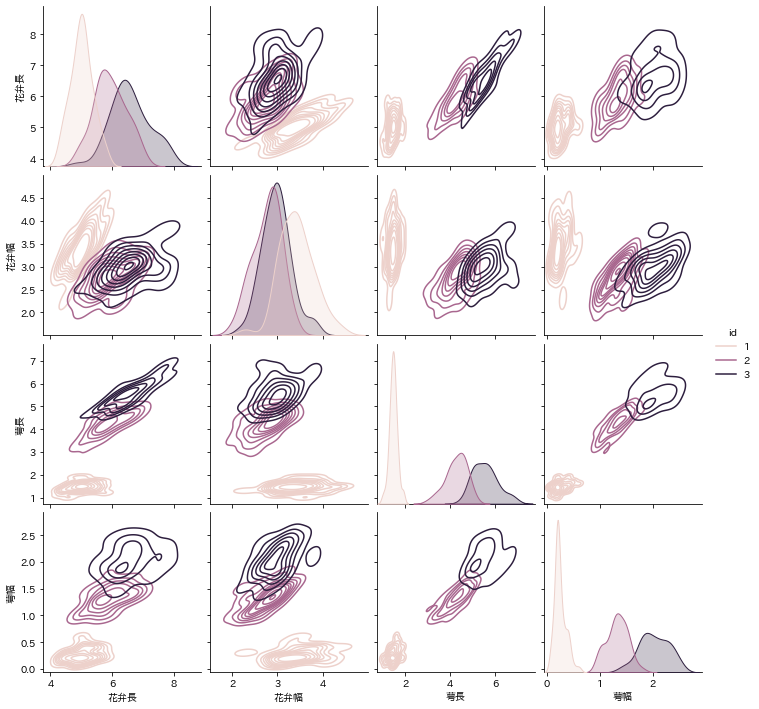

In [38]:
import seaborn as sbn
import japanize_matplotlib
sbn.pairplot(dfAyame,kind="kde",hue="id")

## 関数表示

In [39]:
fig = px.parallel_coordinates(dfAyame, color="id",
                labels={"id": "種名"})
fig.show()

## 3dim射影

In [40]:
def sc3d(a,b,c):
    fig=px.scatter_3d(dfAyame,x=a,y=b,z=c,color="種名",opacity=0.6)
    fig.update_layout(width=600,height=600)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
interact(sc3d  
    ,a=widgets.RadioButtons(description="第1変数",value="花弁長",options=["花弁長","花弁幅","萼長","萼幅"])
    ,b=widgets.RadioButtons(description="第２変数",value="花弁幅",options=["花弁長","花弁幅","萼長","萼幅"])
    ,c=widgets.RadioButtons(description="第３変数",value="萼長",options=["花弁長","花弁幅","萼長","萼幅"])
        )

interactive(children=(RadioButtons(description='第1変数', options=('花弁長', '花弁幅', '萼長', '萼幅'), value='花弁長'), Radio…

<function __main__.sc3d(a, b, c)>

# <font color="red">演習1</font> 次の３次元データ集合 dfD72B について、実習2 を行う

In [41]:
dfD72B=pd.read_csv("https://ac-net.org/tjst/lct/21/21ds2/dfD72B.csv")

In [42]:
dfD72B.axes

[RangeIndex(start=0, stop=1000, step=1),
 Index(['x', 'y', 'z', 'id'], dtype='object')]

In [43]:
dfD72=dfD72B

+ 実習2のセルを以下にまとめてコピーペーストして実行していく

In [44]:
dfD72.axes

[RangeIndex(start=0, stop=1000, step=1),
 Index(['x', 'y', 'z', 'id'], dtype='object')]

## １次元プロット

In [45]:
import plotly.figure_factory as ff
fig = ff.create_distplot([dfD72.x,dfD72.y,dfD72.z],["x","y","z"], \
                         curve_type='kde', show_rug=True, bin_size=.1)
fig.show()

## ２変数への射影

### x,y成分のプロット

In [46]:
fig=px.scatter(dfD72,x="x",y="y",color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

### 色々な組み合わせを見る

In [47]:
def pxscatter(u,v):
    fig=px.scatter(dfD72,x=u,y=v,color="id")
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=500,height=500)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
interact(pxscatter      
    ,u=widgets.RadioButtons(description="第1変数",value="x",options=["x","y","z"])
    ,v=widgets.RadioButtons(description="第2変数",value="y",options=["x","y","z"])
        )

interactive(children=(RadioButtons(description='第1変数', options=('x', 'y', 'z'), value='x'), RadioButtons(descr…

<function __main__.pxscatter(u, v)>

### 二変数組すべてについてのプロット

#### px.scatter_matrix

In [48]:
fig=px.scatter_matrix(dfD72,opacity=0.3,color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

#### seaborn.pairplot

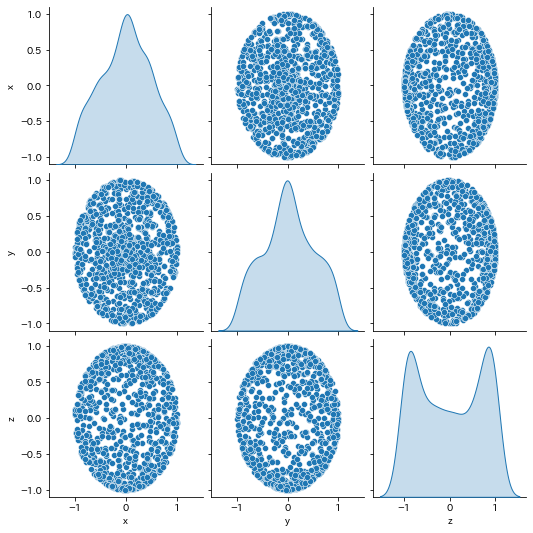

In [49]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],diag_kind="kde")

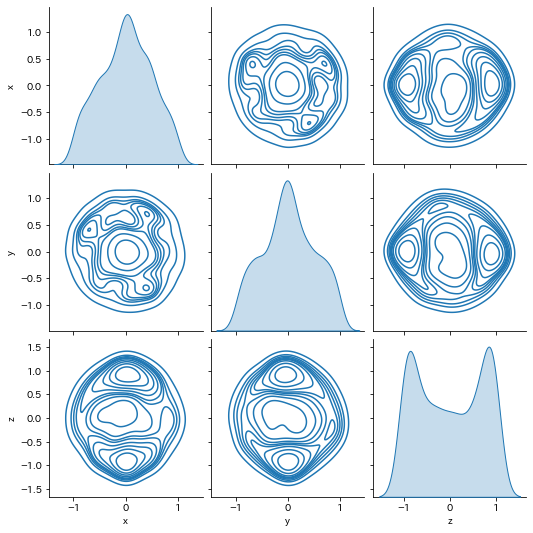

In [50]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="kde")

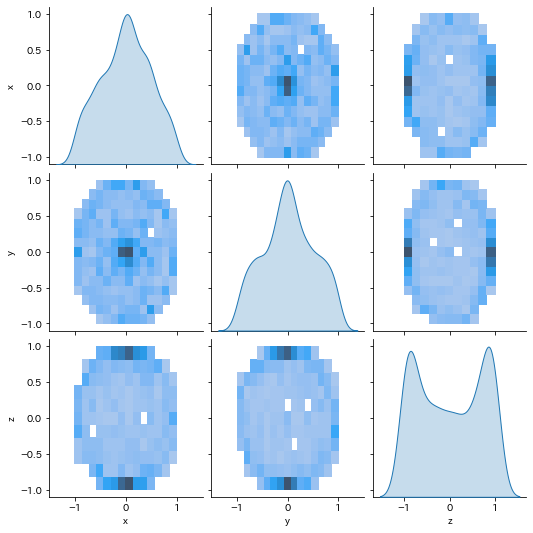

In [51]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="hist",diag_kind="kde")

## 直交射影 $R^3\rightarrow R^2$による射影

+ $\mathbf a\in R^3$に対し、$(\mathbf a,\mathbf e_2,\mathbf e_3)$をグラムシュミットの直交化したものに対応する直交行列をg とし
+ $g^{-1}$は $\mathbf a$を　$x$軸に移す。そこで、$\mathbf x \mapsto g^{-1}\mathbf x$の$yz$平面への射影をとれば、$\mathbf a$が原点となる直交射影となる

In [52]:
import numpy as np
def proj1(x,a):
    x=np.array(x).T
    mtx=np.array([a,[0,1,0],[0,0,1]]).T
    q,r=np.linalg.qr(mtx)
    g=np.linalg.inv(q)
    return (g@x)

def proj(dfD,a,b,c):
    u=[a,b,c]
    temp=dfD[["x","y","z"]].apply(lambda x:proj1(x,u),axis=1)
    dfDtemp=pd.DataFrame(temp.to_list(),columns=["Z","X","Y"])
#    dfDtemp["id"]=dfD["id"]
    fig=px.scatter(dfDtemp,x="Z",y="Y",opacity=0.5,color=dfD.id)
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=400,height=400)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
dt,xmin,xmax=0.01,-3,3

interact(lambda a,b,c:proj(dfD72,a,b,c)
    ,a = widgets.FloatSlider(description='a',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,b = widgets.FloatSlider(description='b',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,c = widgets.FloatSlider(description='c',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
        )

interactive(children=(FloatSlider(value=-1.0, description='a', max=3.0, min=-3.0, readout_format='3.2f', step=…

<function __main__.<lambda>(a, b, c)>

## bubble chart

+ $z$座標の絶対値を大きさで表現

In [53]:
# 全部
#temp=dfD72.iloc[:]

# 最初の300
#temp=dfD72.iloc[:300]

# 最後の300
temp=dfD72.iloc[-100:]

# 色で
#fig=px.scatter(temp,x="x",y="y",color=100*np.abs(temp.z),opacity=0.5)

# サイズで
fig=px.scatter(temp,x="x",y="y",size=100*np.abs(temp.z),opacity=0.5)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500)

## slice

$z\approx a$となる$(x,y)$座標をプロット. $a$を動かす

In [54]:
def sliceFn(epsilon=0.01,z=0):
#    print("epsilon={}".format(epsilon))
    temp=dfD72[dfD72.apply(lambda u: np.abs(u.z-z)<epsilon, axis=1)]
    temp=temp.sort_values(by=["z","x"])
    fig=px.scatter(temp,x="x",y="y",color=temp.id)
    fig.show()

#from __future__ import print_function
#from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import interact
import ipywidgets as widgets
interact(sliceFn        
    ,epsilon = widgets.FloatSlider(description='epsilon',value=0.01,min=0.001,max=0.1,step=0.001,readout_format="7.6f")
    ,z = widgets.FloatSlider(description='z',value=0,min=-5,max=5,step=0.1,readout_format="3.2f")
       )

interactive(children=(FloatSlider(value=0.01, description='epsilon', max=0.1, min=0.001, readout_format='7.6f'…

<function __main__.sliceFn(epsilon=0.01, z=0)>

## 関数表示

In [55]:
fig = px.parallel_coordinates(dfD72,color="id")
fig.show()

## 3次元単純プロット

In [56]:
px.scatter_3d(dfD72,x="x",y="y",z="z",opacity=0.2,color="id")

# <font color="red">演習2</font>次の３次元データ集合 dfD72Cについて、実習2 を行う

In [57]:
dfD72C=pd.read_csv("https://ac-net.org/tjst/lct/21/21ds2/dfD72C.csv")

In [58]:
dfD72=dfD72C

+ 実習2のセルを以下にまとめてコピーペーストして実行していく

In [59]:
dfD72.axes

[RangeIndex(start=0, stop=1000, step=1),
 Index(['x', 'y', 'z', 'id'], dtype='object')]

## １次元プロット

In [60]:
import plotly.figure_factory as ff
fig = ff.create_distplot([dfD72.x,dfD72.y,dfD72.z],["x","y","z"], \
                         curve_type='kde', show_rug=True, bin_size=.1)
fig.show()

## ２変数への射影

### x,y成分のプロット

In [61]:
fig=px.scatter(dfD72,x="x",y="y",color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

### 色々な組み合わせを見る

In [62]:
def pxscatter(u,v):
    fig=px.scatter(dfD72,x=u,y=v,color="id")
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=500,height=500)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
interact(pxscatter      
    ,u=widgets.RadioButtons(description="第1変数",value="x",options=["x","y","z"])
    ,v=widgets.RadioButtons(description="第2変数",value="y",options=["x","y","z"])
        )

interactive(children=(RadioButtons(description='第1変数', options=('x', 'y', 'z'), value='x'), RadioButtons(descr…

<function __main__.pxscatter(u, v)>

### 二変数組すべてについてのプロット

#### px.scatter_matrix

In [63]:
fig=px.scatter_matrix(dfD72,opacity=0.3,color="id")
fig.update_yaxes(scaleanchor="x", scaleratio=1)

#### seaborn.pairplot

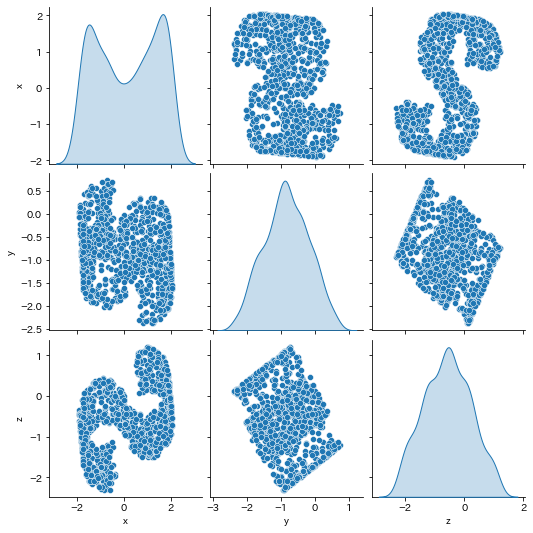

In [64]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],diag_kind="kde")

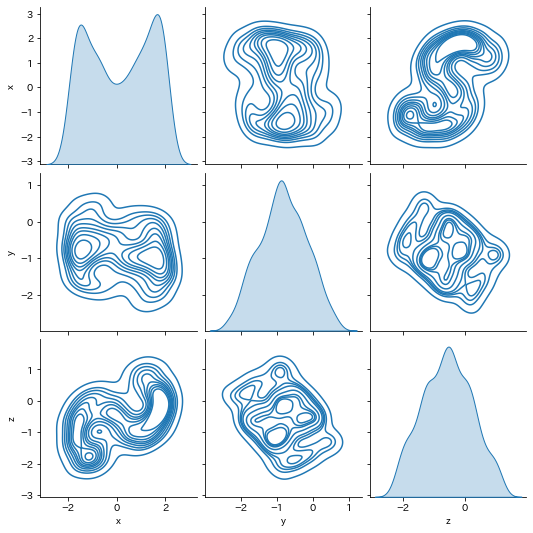

In [65]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="kde")

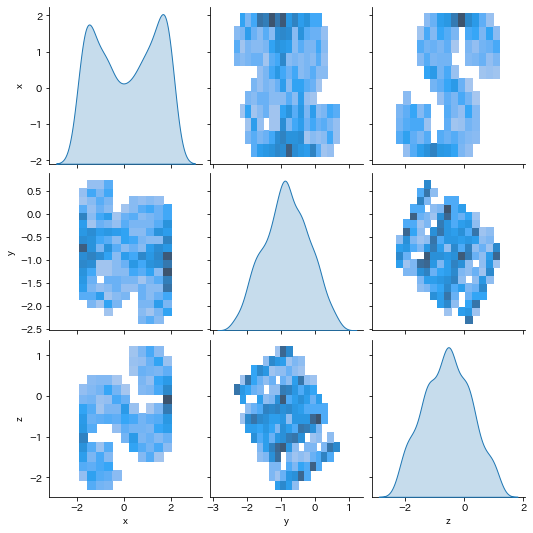

In [66]:
import seaborn as sbn
sbn.pairplot(dfD72[["x","y","z"]],kind="hist",diag_kind="kde")

## 直交射影 $R^3\rightarrow R^2$による射影

+ $\mathbf a\in R^3$に対し、$(\mathbf a,\mathbf e_2,\mathbf e_3)$をグラムシュミットの直交化したものに対応する直交行列をg とし
+ $g^{-1}$は $\mathbf a$を　$x$軸に移す。そこで、$\mathbf x \mapsto g^{-1}\mathbf x$の$yz$平面への射影をとれば、$\mathbf a$が原点となる直交射影となる

In [67]:
import numpy as np
def proj1(x,a):
    x=np.array(x).T
    mtx=np.array([a,[0,1,0],[0,0,1]]).T
    q,r=np.linalg.qr(mtx)
    g=np.linalg.inv(q)
    return (g@x)

def proj(dfD,a,b,c):
    u=[a,b,c]
    temp=dfD[["x","y","z"]].apply(lambda x:proj1(x,u),axis=1)
    dfDtemp=pd.DataFrame(temp.to_list(),columns=["Z","X","Y"])
#    dfDtemp["id"]=dfD["id"]
    fig=px.scatter(dfDtemp,x="Z",y="Y",opacity=0.5,color=dfD.id)
    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_layout(width=400,height=400)
    fig.show()

from ipywidgets import interact
import ipywidgets as widgets
dt,xmin,xmax=0.01,-3,3

interact(lambda a,b,c:proj(dfD72,a,b,c)
    ,a = widgets.FloatSlider(description='a',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,b = widgets.FloatSlider(description='b',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
    ,c = widgets.FloatSlider(description='c',value=np.random.randint(xmin,xmax),min=xmin,max=xmax,step=dt,readout_format="3.2f")
        )

interactive(children=(FloatSlider(value=1.0, description='a', max=3.0, min=-3.0, readout_format='3.2f', step=0…

<function __main__.<lambda>(a, b, c)>

## bubble chart

+ $z$座標の絶対値を大きさで表現

In [68]:
# 全部
#temp=dfD72.iloc[:]

# 最初の300
#temp=dfD72.iloc[:300]

# 最後の300
temp=dfD72.iloc[-100:]

# 色で
#fig=px.scatter(temp,x="x",y="y",color=100*np.abs(temp.z),opacity=0.5)

# サイズで
fig=px.scatter(temp,x="x",y="y",size=100*np.abs(temp.z),opacity=0.5)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_layout(width=500)

## slice

$z\approx a$となる$(x,y)$座標をプロット. $a$を動かす

In [69]:
def sliceFn(epsilon=0.01,z=0):
#    print("epsilon={}".format(epsilon))
    temp=dfD72[dfD72.apply(lambda u: np.abs(u.z-z)<epsilon, axis=1)]
    temp=temp.sort_values(by=["z","x"])
    fig=px.scatter(temp,x="x",y="y",color=temp.id)
    fig.show()

#from __future__ import print_function
#from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import interact
import ipywidgets as widgets
interact(sliceFn        
    ,epsilon = widgets.FloatSlider(description='epsilon',value=0.01,min=0.001,max=0.1,step=0.001,readout_format="7.6f")
    ,z = widgets.FloatSlider(description='z',value=0,min=-5,max=5,step=0.1,readout_format="3.2f")
       )

interactive(children=(FloatSlider(value=0.01, description='epsilon', max=0.1, min=0.001, readout_format='7.6f'…

<function __main__.sliceFn(epsilon=0.01, z=0)>

## 関数表示

In [70]:
fig = px.parallel_coordinates(dfD72,color="id")
fig.show()

## 3次元単純プロット

In [71]:
px.scatter_3d(dfD72,x="x",y="y",z="z",opacity=0.2,color="id")

+ アンケートの考察については、どの程度の文字数で示すことが望ましいでしょうか。

+ レポート課題の提出窓口について、「白紙」とは、「何もファイルを提出していない状態」を指すものでしょうか。